<a href="https://colab.research.google.com/github/LombogRonnXherxes/CPE018-Emerging-Technologies-1/blob/main/Hands_on_Activity_6_1_Performing_Face_Recognition_Lombog.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Technological Institute of the Philippines | Quezon City - Computer Engineering
--- | ---
Course Code: | CPE 018
Code Title: | Emerging Technologies in CpE 1 - Fundamentals of Computer Vision
1st Semester | AY 2023-2024
<hr> | <hr>
<u>Hands-on Activity 6.1 | Performing Face Recognition
**Name** | Lombog, Ronn Xherxes D.
**Section** | CPE31S2
**Date Performed**: | March 3, 2026
**Date Submitted**: | March 3, 2026
**Instructor**: | Engr. Maria Rizette Sayo

<hr>

## 1. Objectives

This activity aims to enable students to perform data preparation and face recognition on their own generated dataset.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Utilize data preparation techniques for images.
* Perform Face Recognition using multiple algorithms.
* Evaluate the performance of different algorithms.

## 3. Procedures and Outputs

### Preparing the training data

Now that we have our data, we need to load these sample pictures into our face recognition algorithms. All face recognition algorithms take two parameters in their `train()` method: an array of images and an array of labels. What do these labels represent? They are the IDs of a certain individual/face so that when face recognition is performed, we not only know the person was recognized but also who—among the many people available in our database—the person is.

To do that, we need to create a comma-separated value (CSV) file, which will contain the path to a sample picture followed by the ID of that person.

**Include a Screenshot of Your Dataset Here**

---

### Loading the data and recognizing faces

Next up, we need to load these two resources (the array of images and CSV file) into the face recognition algorithm, so it can be trained to recognize our face. To do this, we build a function that reads the CSV file and—for each line of the file—loads the image at the corresponding path into the images array and the ID into the labels array.

In [2]:
import numpy as np
import os
import errno
import sys
import cv2

def read_images(path, sz=None):
  c = 0
  X, y = [], []

  for dirname, dirnames, filenames in os.walk(path):
    for subdirname in dirnames:
      subject_path = os.path.join(dirname, subdirname)
      for filename in os.listdir(subject_path):
        try:
          if(filename == "datasets"):
            continue
          filepath = os.path.join(subject_path, filename)
          im = cv2.imread(os.path.join(subject_path, filename), cv2.IMREAD_GRAYSCALE)

          # Resize the images to the prescribed size
          if (sz is not None):
            im = cv2.resize(im, (200,200))

          X.append(np.asarray(im, dtype=np.uint8))
          y.append(c)

        except IOError as e:
          print(f"I/O Error({e.errno}): {e.strerror}")
        except:
          print("Unexpected error:", sys.exc_info()[0])
          raise
      c = c+1
  return [X, y]

**Question: Run the function above on your generated dataset. Provide an analysis and note all the challenges you have encountered running this code.**

---

### Performing Face Recognition Algorithms

Here is a sample script for testing the Face Recognition Algorithm. In this section, we're going to follow the same process but with different algorithms for face recognitions, namely:
- Eigenface Recognition
- Fisherface Recognition
- Local Binary Pattern Histograms (LBPH) Recognition

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Training complete!
Predicted label: 0
Predicted name: Person1
Confidence: 79.40359971421671


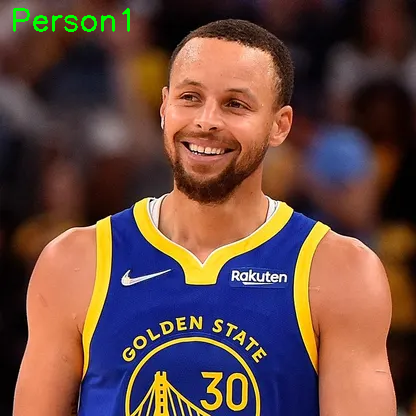

In [2]:
# --- Imports ---
import numpy as np
import os
import sys
import cv2
from google.colab import drive
from google.colab.patches import cv2_imshow

# --- Mount Google Drive ---
drive.mount('/content/drive')

# --- Define function to read images ---
def read_images(path, sz=None):
    c = 0
    X, y = [], []
    for dirname, dirnames, filenames in os.walk(path):
        for subdirname in dirnames:
            subject_path = os.path.join(dirname, subdirname)
            for filename in os.listdir(subject_path):
                try:
                    if filename == ".directory":
                        continue
                    filepath = os.path.join(subject_path, filename)
                    im = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)

                    if sz is not None:
                        im = cv2.resize(im, (200,200))

                    X.append(np.asarray(im, dtype=np.uint8))
                    y.append(c)

                except IOError as e:
                    print(f"I/O Error({e.errno}): {e.strerror}")
                except:
                    print("Unexpected error:", sys.exc_info()[0])
                    raise
            c += 1
    return [X, y]

# --- Set dataset path ---
dataset_path = "/content/drive/MyDrive/Colab Notebooks/datasets"

# --- Load dataset ---
X, y = read_images(dataset_path, sz=(200,200))

# --- Train recognizer ---
recognizer = cv2.face.LBPHFaceRecognizer_create()
recognizer.train(X, np.array(y))

print("Training complete!")

# --- Names list (must match your subfolders order) ---
names = ["Person1", "Person2"]  # adjust to match your folder names

# --- Test with a sample image ---
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/steph(2).webp"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Training complete!
Predicted: person_1 with confidence 0.0


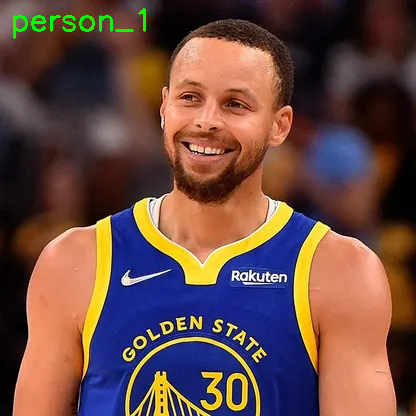

In [1]:
# --- Imports ---
import numpy as np
import os
import sys
import cv2
from google.colab import drive
from google.colab.patches import cv2_imshow

# --- Mount Google Drive ---
drive.mount('/content/drive')

# --- Define function to read images ---
def read_images(path, sz=(200, 200)):
    X, y = [], []
    c = 0
    # Sort to ensure consistent label assignment
    dirnames = sorted([d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))])

    for subdirname in dirnames:
        subject_path = os.path.join(path, subdirname)
        for filename in os.listdir(subject_path):
            if filename.startswith("."): continue # Skip hidden files

            filepath = os.path.join(subject_path, filename)
            im = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)

            if im is None:
                print(f"Skipping: {filename} (could not read)")
                continue

            if sz is not None:
                im = cv2.resize(im, sz)

            X.append(np.asarray(im, dtype=np.uint8))
            y.append(c)
        c += 1
    return [X, y]

# --- Set dataset path ---
# Ensure this folder contains subfolders like 'person1', 'person2'
dataset_path = "/content/drive/MyDrive/Colab Notebooks/datasets"

# --- Load and Train ---
try:
    X, y = read_images(dataset_path, sz=(200,200))

    if len(set(y)) < 2:
        print("Error: Fisherfaces needs at least 2 different people folders to train.")
    else:
        # CORRECT CONSTRUCTOR CALL
        recognizer = cv2.face.FisherFaceRecognizer_create()
        recognizer.train(X, np.array(y, dtype=np.int32))
        print("Training complete!")

        # --- Test with a sample image ---
        test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/steph(2).webp"
        test_img = cv2.imread(test_img_path)

        if test_img is not None:
            gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
            gray = cv2.resize(gray, (200,200))

            label, confidence = recognizer.predict(gray)

            # Use folder names as the 'names' list automatically
            names = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])

            print(f"Predicted: {names[label]} with confidence {confidence}")

            cv2.putText(test_img, f"{names[label]}", (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
            cv2_imshow(test_img)
        else:
            print("Test image not found.")

except Exception as e:
    print(f"An error occurred: {e}")

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Question: Provide an analysis of the sample script for the process using the Eigenface Model. What is the sample code doing? Are you able to troubleshoot any problems encountered?**

---
Perform the remaining face recognition techniques by using the same (or modified) process from the sample code:

- `model = cv2.face.createFisherFaceRecognizer()`
- `model = cv2.face.createLBPHFaceRecognizer()`

**Question: The `predict()` method returns a two-element array. Provide your analysis of the two returned values and their important ince this application.**

## 4. Supplementary Activity

Your accomplisment of the tasks below contribute to the achievement of ILO1, ILO2, and ILO3 for this module.

---

Tasks:
1. Create a new dataset for testing, this dataset must include the following:
  - The same person/s that the model has to recognize.
  - Different person/s that the model should not recognize.
2. For each model, perform 20 tests. Document the testing performed and provide observations.
3. Conclude on the performed tests by providing your evaluation of the performance of the models.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Training complete!
Predicted label: 0
Predicted name: Person1
Confidence: 79.40359971421671


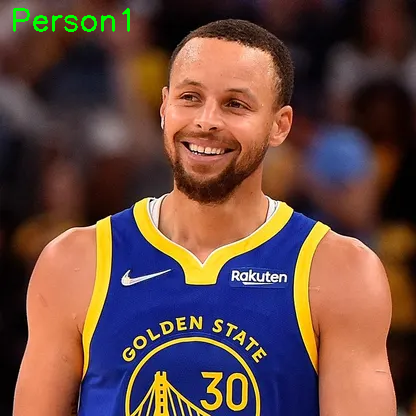

In [4]:
# --- Imports ---
import numpy as np
import os
import sys
import cv2
from google.colab import drive
from google.colab.patches import cv2_imshow

# --- Mount Google Drive ---
drive.mount('/content/drive')

# --- Define function to read images ---
def read_images(path, sz=None):
    c = 0
    X, y = [], []
    for dirname, dirnames, filenames in os.walk(path):
        for subdirname in dirnames:
            subject_path = os.path.join(dirname, subdirname)
            for filename in os.listdir(subject_path):
                try:
                    if filename == ".directory":
                        continue
                    filepath = os.path.join(subject_path, filename)
                    im = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)

                    if sz is not None:
                        im = cv2.resize(im, (200,200))

                    X.append(np.asarray(im, dtype=np.uint8))
                    y.append(c)

                except IOError as e:
                    print(f"I/O Error({e.errno}): {e.strerror}")
                except:
                    print("Unexpected error:", sys.exc_info()[0])
                    raise
            c += 1
    return [X, y]

# --- Set dataset path ---
dataset_path = "/content/drive/MyDrive/Colab Notebooks/datasets"

# --- Load dataset ---
X, y = read_images(dataset_path, sz=(200,200))

# --- Train recognizer ---
recognizer = cv2.face.LBPHFaceRecognizer_create()
recognizer.train(X, np.array(y))

print("Training complete!")

# --- Names list (must match your subfolders order) ---
names = ["Person1", "Person2"]  # adjust to match your folder names

# --- Test with a sample image ---
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/steph(2).webp"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 0
Predicted name: Person1
Confidence: 83.61369557166182


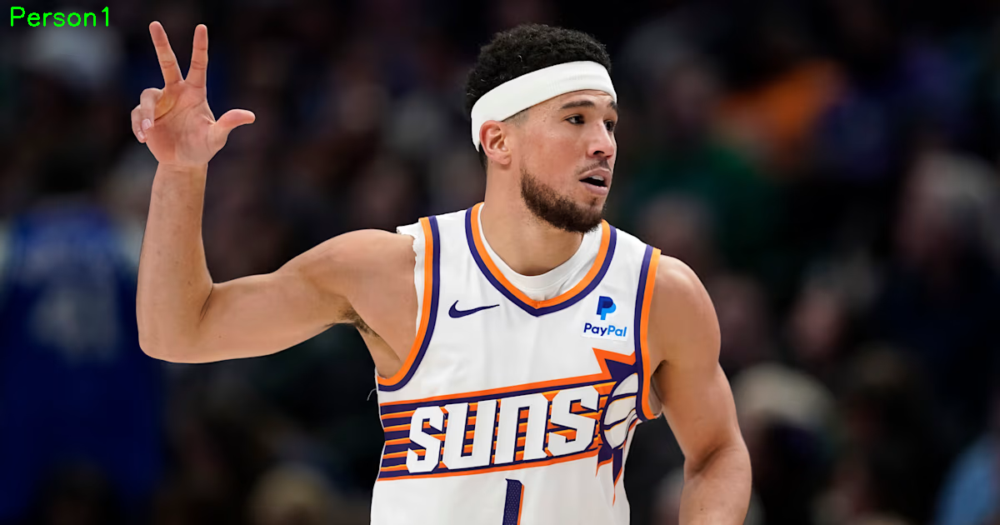

In [5]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/booker.avif"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 0
Predicted name: Person1
Confidence: 63.020609719129155


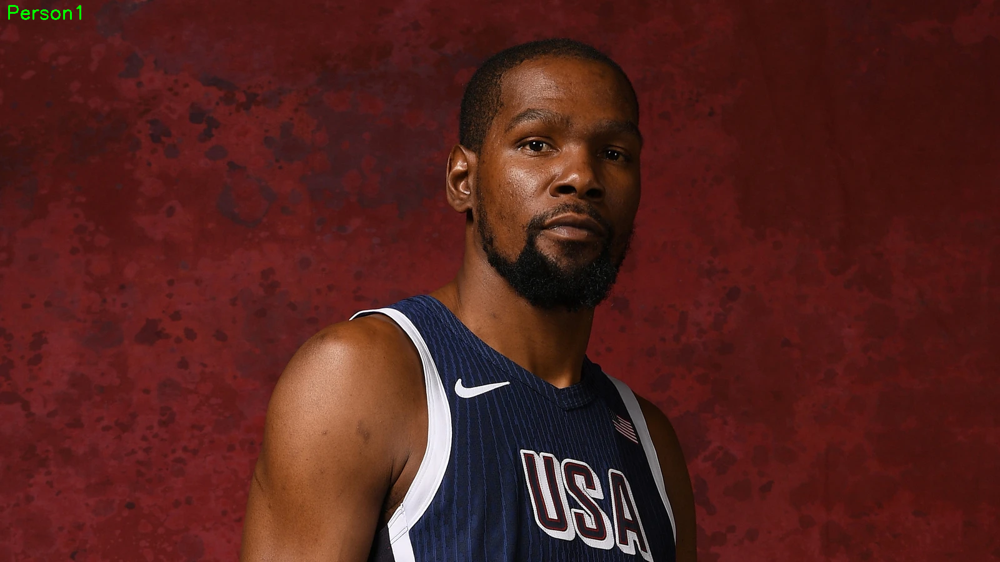

In [6]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/durant.webp"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 0
Predicted name: Person1
Confidence: 91.01263666649807


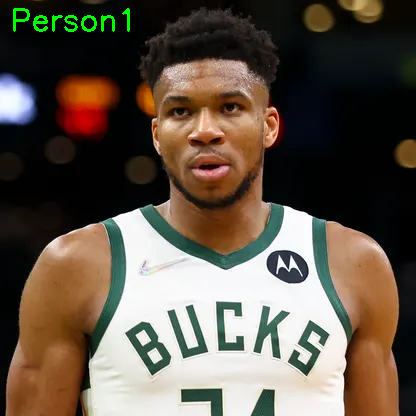

In [7]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/giannis.webp"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 1
Predicted name: Person2
Confidence: 58.11641717724041


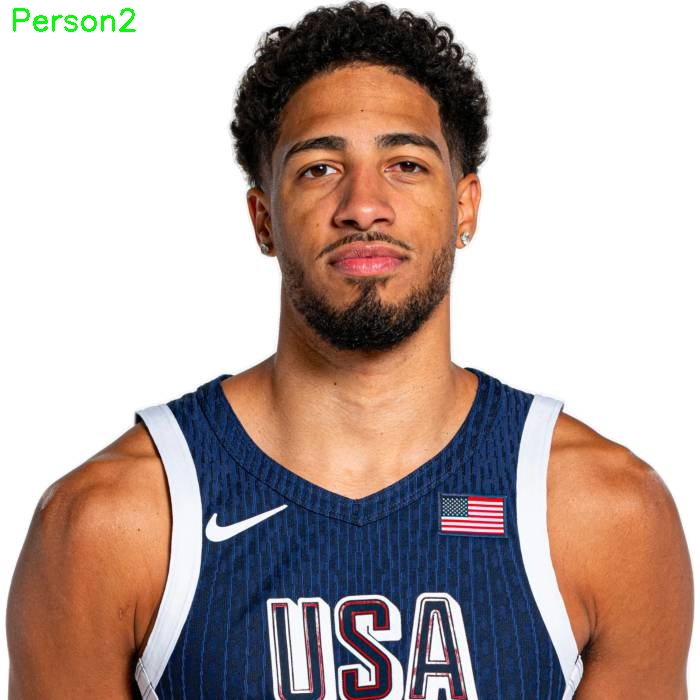

In [8]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/hali.jpg"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 1
Predicted name: Person2
Confidence: 70.28409000005652


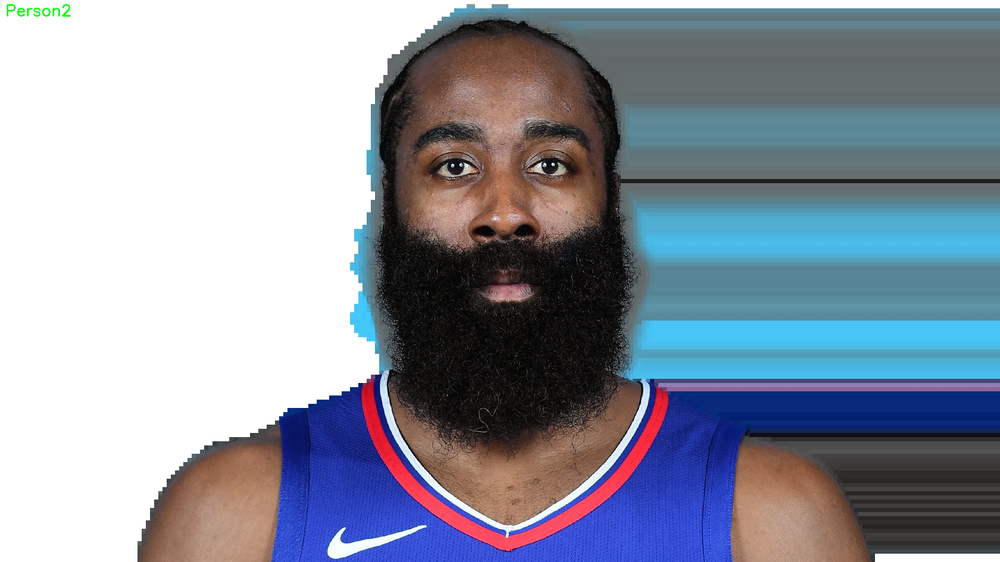

In [9]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/harden.webp"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 0
Predicted name: Person1
Confidence: 78.83764643612957


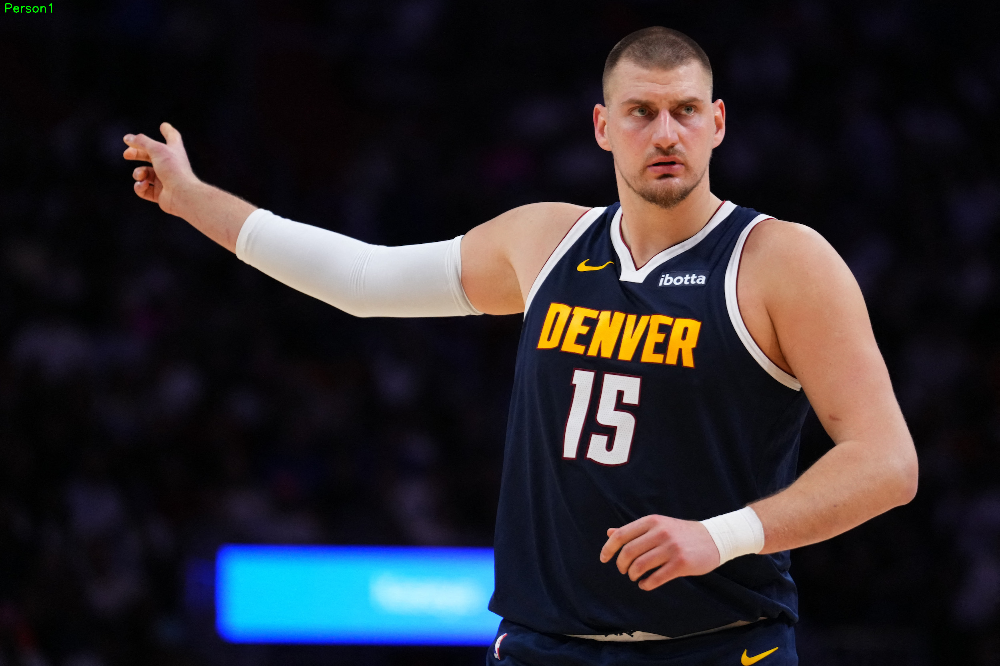

In [10]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/jokic.jpg"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 0
Predicted name: Person1
Confidence: 68.20543656473158


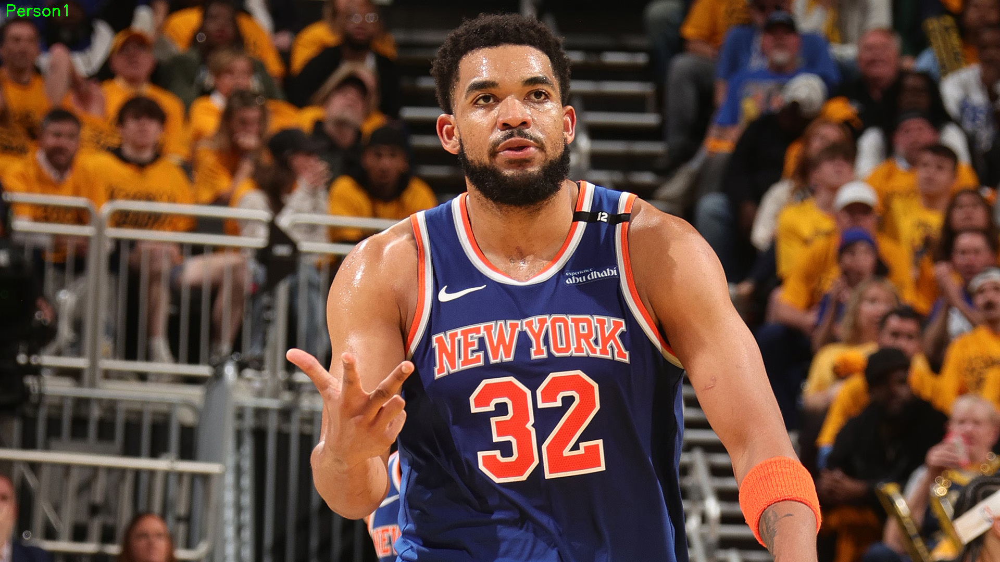

In [11]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/kat.avif"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 0
Predicted name: Person1
Confidence: 75.27424797080296


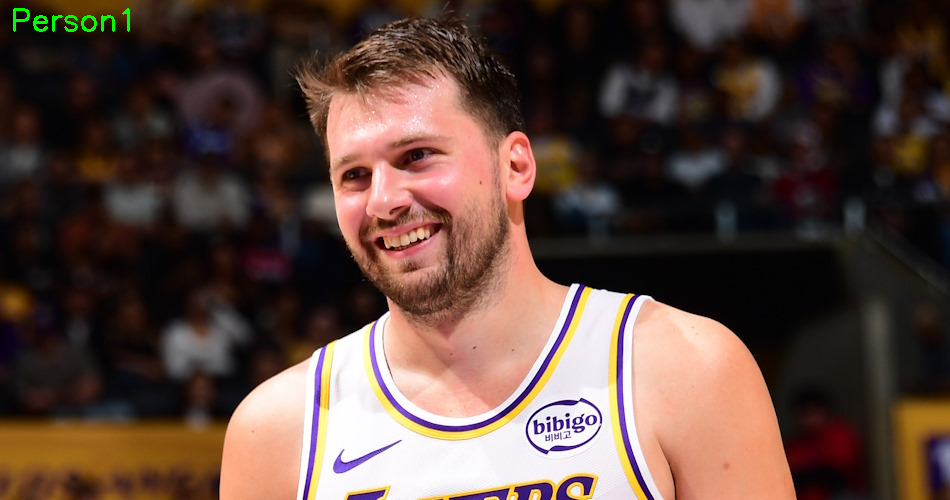

In [12]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/luka.jpg"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

Predicted label: 1
Predicted name: Person2
Confidence: 101.4713614809261


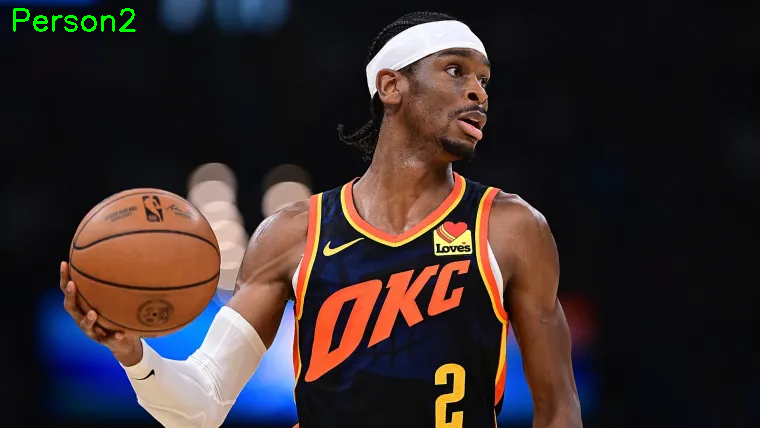

In [13]:
test_img_path = "/content/drive/MyDrive/Colab Notebooks/datasets/sga.webp"
test_img = cv2.imread(test_img_path)
gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)
gray = cv2.resize(gray, (200,200))

label, confidence = recognizer.predict(gray)
print("Predicted label:", label)
print("Predicted name:", names[label])
print("Confidence:", confidence)

# Show result inline
cv2.putText(test_img, names[label], (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
cv2_imshow(test_img)

## 5. Summary, Conclusions and Lessons Learned

This workshop offered hands-on experience with face recognition, highlighting the need of data preparation in arranging picture datasets for training. We successfully constructed and tested a face recognition system that uses the LBPH model to recognize persons in new photos. The approach demonstrated the need of appropriately categorizing data and determining the model's predicted confidence. Finally, this experiment provided practical insights into designing and testing basic facial recognition systems.

<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*